# Advanced Lane Detection

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
# Importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pickle
import cv2
import glob
#%matplotlib inline

## Camera Calibration

* OpenCV functions and other methods are used to calculate the correct camera matrix and distortion coefficients using the calibration chessboard images provided in the repository. 
* The distortion matrix is used to un-distort the calibration images.

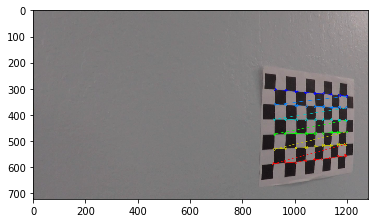

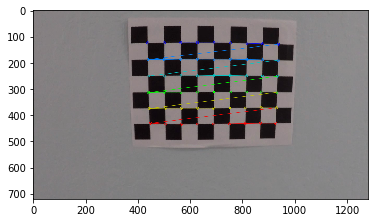

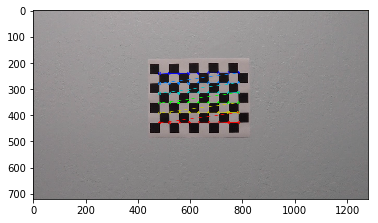

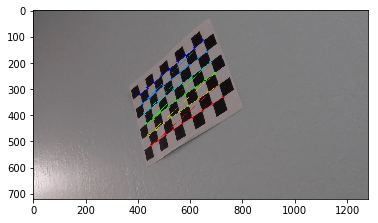

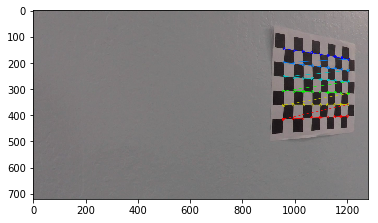

...

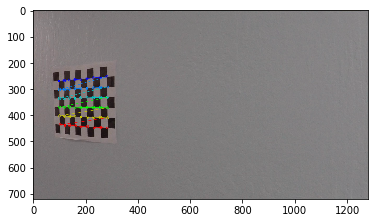

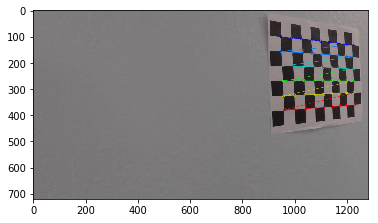

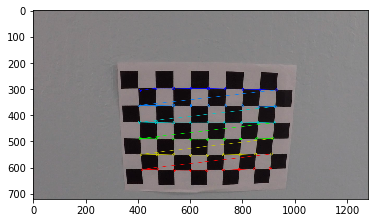

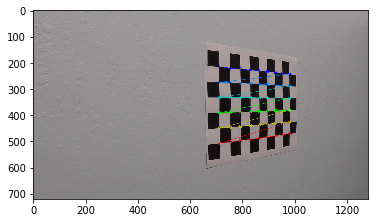

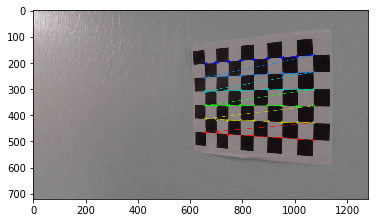

In [2]:
# prepare object points
nx = 9 #the number of inside corners in x in chessboard images
ny = 6 #the number of inside corners in y in chessboard images

# Arrays to store object points and image points from all the images
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# Prepare object points like (0,0,0), (1,0,0), (2,0,0)......(8,5,0)
objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # x, y co-ordinates

# Read in and make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
    
# Step through the list and search for chessboard corners
for img in images:
    # Read the image
    image = cv2.imread(img)
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw chessboard corners
        image = cv2.drawChessboardCorners(image, (nx,ny), corners, ret)
        fig = plt.figure()
        plt.imshow(image)    

In [3]:
# Test undistortion on a chessboard image
img = cv2.imread('camera_cal/calibration2.jpg')
# Calculate the size of image
img_size = (img.shape[1], img.shape[0])

# Do camera calibration on obtained object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Undistort the image
dst = cv2.undistort(img, mtx, dist, None, mtx)

#Save the output undistorted image
cv2.imwrite('output_images/camera_cal/calibration2.jpg',dst)

# Save the camera calibration result for later use to undistort road images
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration_pickle.p", "wb" ) )

In [4]:
# Function to undistort the image
def undistort(image):
    dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) ) # Read the pickle file which contains the camera calibration co-efficients
    mtx = dist_pickle["mtx"] # Read the camera calibration matrix
    dist = dist_pickle["dist"] # Read the distortion co-efficients
    undist = cv2.undistort(image, mtx, dist, None, mtx) # Undistort the image
    return undist

Text(0.5,1,'Undistorted Image')

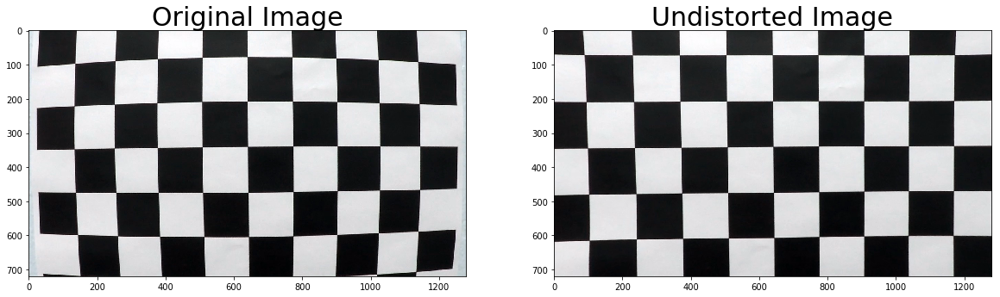

In [5]:
#Distortion corrected camera calibration image
image_orig = 'camera_cal/calibration1.jpg'
img = cv2.imread(image_orig) # Read the image
undist = undistort(img) # Undistort the image

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

## Test Images

In [6]:
import os
os.listdir("test_images/")

['test1.jpg',
 'test6.jpg',
 'straight_lines2.jpg',
 'test4.jpg',
 'test5.jpg',
 'straight_lines1.jpg',
 'test3.jpg',
 'test2.jpg']

### Methods to create a thresholded binary image

In [7]:
# Convert image to grayscale
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur to image
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

# Define a function that takes an image, gradient orientation, and threshold min / max values
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=20, thresh_max=100):
    # Convert to grayscale
    gray = grayscale(img)
    # Apply x or y gradient with the OpenCV Sobel() function and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # inclusive (>=, <=) thresholds
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    # Convert to grayscale
    gray = grayscale(img)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to convert to HLS color space
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    # Return the binary image
    return binary_output

# Get thresholded binary image
def get_thresholded_binary_image(undist, is_video=False):    
    #read image
    #if is_video == False:
    #    image = cv2.imread(image)
    
    # Undistort image
    #undist = undistort(image) 
    
    # Find the gradient binary threshold
    grad_binaryX = abs_sobel_thresh(undist, orient='x', sobel_kernel=3, thresh_min=20, thresh_max=100)
    grad_binaryY = abs_sobel_thresh(undist, orient='y', sobel_kernel=3, thresh_min=20, thresh_max=100)
    
    # Find the magnitude binary threshold
    mag_binary = mag_thresh(undist, sobel_kernel=3, mag_thresh=(20, 100))
    
    # Find the direction binary threshold
    dir_binary = dir_threshold(undist, sobel_kernel=15, thresh=(0.7, 1.4))
    
    combined = np.zeros_like(dir_binary)
    combined[((grad_binaryX == 1) & (grad_binaryY == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    #convert to HLS color space
    hls_binary = hls_select(undist, thresh=(150, 255))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(grad_binaryX)
    combined_binary[(hls_binary == 1) | (combined == 1)] = 1
    
    #combined_binary = np.zeros_like(grad_binaryX)
    #combined_binary[(hls_binary == 1) | (grad_binaryX == 1)| ((mag_binary == 1) & (dir_binary == 1))] = 1
 
    return undist, grad_binaryX, mag_binary, dir_binary, hls_binary, combined_binary

### Perspective Transform

In [8]:
# Define Perspective Transform
def get_perspectiveTransform(img):
    img_size = (img.shape[1], img.shape[0])
    
    #leftupperpoint  = [568,470]
    #rightupperpoint = [717,470]
    #leftlowerpoint  = [260,680]
    #rightlowerpoint = [1043,680]
    
    leftupperpoint  = [567,470]
    rightupperpoint = [718,470]
    leftlowerpoint  = [260,680]
    rightlowerpoint = [1044,680]
    
    src = np.float32([leftupperpoint, leftlowerpoint, rightupperpoint, rightlowerpoint])
    dst = np.float32([[200,0], [200,680], [1000,0], [1000,680]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warpedImage = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)
    
    return warpedImage, M

### Visualization

Text(0.5,1,'Warped Image')

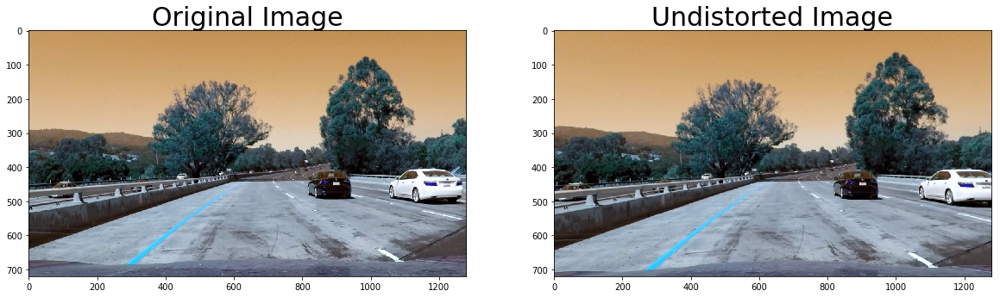

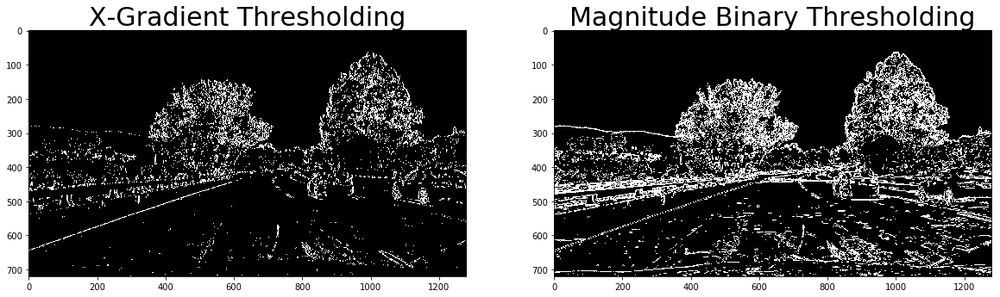

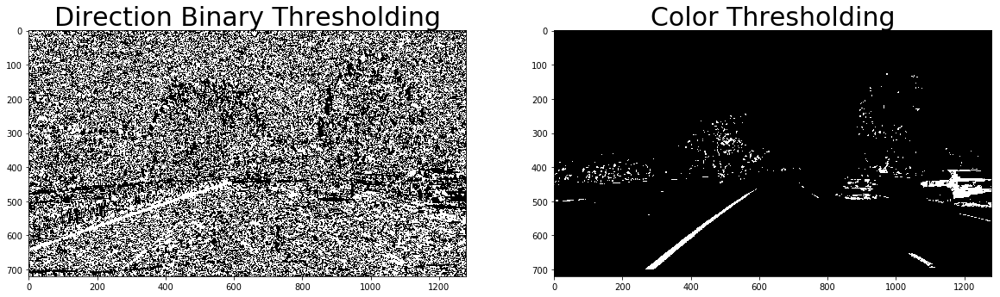

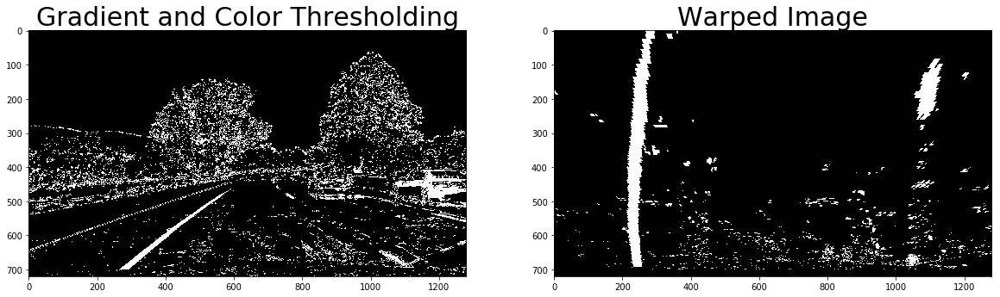

In [9]:
original_img= 'test_images/test1.jpg'
img = cv2.imread(original_img) # Read the image
# Undistort image
undistorted = undistort(img)
# Get thresholded binary image
undist, grad_binaryX, mag_binary, dir_binary, hls_binary, combined_binary = get_thresholded_binary_image(undistorted)

# Apply perspective transform
warped_image, M = get_perspectiveTransform(combined_binary)

# Visualize Thresholding
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img, cmap = 'Greys_r')
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist, cmap = 'Greys_r')
ax2.set_title('Undistorted Image', fontsize=30)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(grad_binaryX, cmap = 'Greys_r')
ax1.set_title('X-Gradient Thresholding', fontsize=30)
ax2.imshow(mag_binary, cmap = 'Greys_r')
ax2.set_title('Magnitude Binary Thresholding', fontsize=30)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(dir_binary, cmap = 'Greys_r')
ax1.set_title('Direction Binary Thresholding', fontsize=30)
ax2.imshow(hls_binary, cmap = 'Greys_r')
ax2.set_title('Color Thresholding', fontsize=30)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(combined_binary, cmap = 'Greys_r')
ax1.set_title('Gradient and Color Thresholding', fontsize=30)
ax2.imshow(warped_image, cmap = 'Greys_r')
ax2.set_title('Warped Image', fontsize=30)


### Save test images output

Outputs are saved in output_image/test_images folder.

In [10]:
# Read in and make a list of calibration images
#test_images = glob.glob('test_images/*.jpg')
    
# Step through the list and search for chessboard corners
#for img in test_images:
#    undist, grad_binaryX, mag_binary, dir_binary, hls_binary, combined_binary, warped_image, M = pipeline(img)
    #Save the output undistorted image
#    cv2.imwrite("output_images/" + img + "_undist.jpg", undist)
#    cv2.imwrite("output_images/" + img + "_grad_binaryX.jpg", grad_binaryX*255)
#    cv2.imwrite("output_images/" + img + "_mag_binary.jpg", mag_binary*255)
#    cv2.imwrite("output_images/" + img + "_dir_binary.jpg", dir_binary*255)
#    cv2.imwrite("output_images/" + img + "_hls_binary.jpg", hls_binary*255)
#    cv2.imwrite("output_images/" + img + "_combined_binary.jpg", combined_binary*255)
#    cv2.imwrite("output_images/" + img + "_warped_image.jpg", warped_image*255)

### Line Finding Method: 

After applying calibration, thresholding, and a perspective transform to a road image, we have obtained a binary image where the lane lines stand out clearly. However, we still need to decide explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line. In order to achieve this, following methods are followed.

### Histogram

We can plot a histogram of where the binary activations occur. Taking a histogram along all the columns in the lower half of the image and adding up the pixel values.

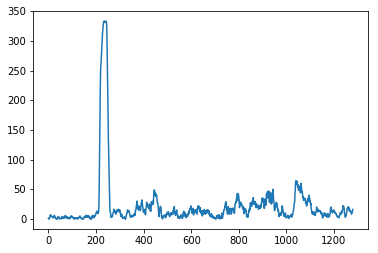

In [11]:
# Create histogram of image binary activations
histogram = np.sum(warped_image[warped_image.shape[0]//2:,:], axis=0)
# Visualize the resulting histogram
plt.plot(histogram)

### Sliding Window

In our thresholded binary image, pixels are either 0 or 1, so the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. We can use that as a starting point for where to search for the lines. From that point, we can use a sliding window, placed around the line centers, to find and follow the lines up to the top of the frame.
Following steps are follwed to draw the lane lines using Sliding Window Technique.
* Split the histogram for the two lane lines
* Set up windows and window hyperparameters
* Iterate through nwindows to track curvature
* Fit a polynomial
* Visualization

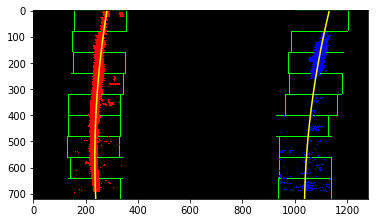

In [12]:
# Visualize Sliding Window
def Visualize_sliding_window(binary_warped):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    plt.imshow(out_img)  

Visualize_sliding_window(warped_image)

In [13]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, left_lane_inds, right_lane_inds


def fit_polynomial(binary_warped, is_plot=True):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, left_lane_inds, right_lane_inds = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    return left_fit, right_fit, left_lane_inds, right_lane_inds

left_fit, right_fit, left_lane_inds, right_lane_inds = fit_polynomial(warped_image, is_plot=True)

### Search from Prior (Skip the Sliding Window)

Lane lines don't necessarily move a lot from frame to frame. Hence, we do not need to apply Sliding Window Technique to each frame. Instead we can just search in a margin around the previous line position.

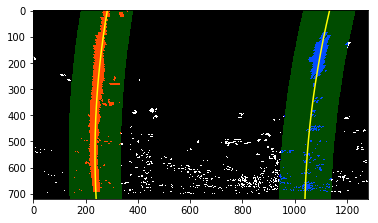

In [14]:
def visualize_marginFrame(left_fit, right_fit, binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
   
    # View your output
    plt.imshow(result)
    
visualize_marginFrame(left_fit, right_fit, warped_image)

In [15]:
def search_around_poly(left_fit, right_fit, binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    left_fit_new = np.polyfit(lefty, leftx, 2)
    right_fit_new = np.polyfit(righty, rightx, 2)
    
    return left_fit_new, right_fit_new

left_fit, right_fit  = search_around_poly(left_fit, right_fit, warped_image)

### Radius of Curvature

In [16]:
def measure_radius_of_curvature(binary_warped, left_fit, right_fit):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Define y-value where we want radius of curvature
    # Choosing the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate radius of curvature
    left_curvature =  ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    right_curvature = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    radius_curvature = (left_curvature + right_curvature)/2.
    
    # Calculate vehicle center
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[1]*y_eval + right_fit[2]
    
    # Lane center as mid of left and right lane bottom                        
    lane_center = (left_lane_bottom + right_lane_bottom)/2.
    center_image = (binary_warped.shape[1])/2.
    center = (lane_center - center_image)*xm_per_pix
    
    position = "left" if center < 0 else "right"
    center = "Vehicle is {:.2f}m {}".format(center, position)
    
    # Now our radius of curvature is in meters
    return radius_curvature, center

In [17]:
#### Draw Lane Lines on original image 
def draw_lane_lines(undist, warped_img, left_fit, right_fit, M, radius_curvature, center, show_values = False):
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    Minv = np.linalg.inv(M)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], warped_img.shape[0]))
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    #radius_curvature = (left_curvature + right_curvature)/2.
    cv2.putText(result, 'Radius of Curvature: {:.0f} m'.format(radius_curvature), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)    
    cv2.putText(result, '{}'.format(center), (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    if show_values == True:
        fig, ax = plt.subplots(figsize=(20, 10))
        ax.imshow(result)   
    return result

## Test Pipeline

In [18]:
# Sanity checks for the lane lines are done based on the following conditions.
# 1. Check if the two lane lines are parallel
# 2. Check if the distance between the two lane lines makes sense (it should be close to 3.7m)
# 3. Check if the current lines are similar to the lines detected in the previous frame
def is_validLane(left_fit, right_fit):
    
    #Check if left and right fit are not nill
    if len(left_fit) ==0 or len(right_fit) == 0:
        isValid = False

    else:
        # Check if the distance between the two lane lines makes sense (it should be close to 3.7m)
        ploty = np.linspace(0, 20, num=10)
        
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        line_space = np.mean(right_fitx - left_fitx)
        if line_space >= 150 and line_space <=430: 
            isValid = True
        else:
            isValid = False
        
        # Check if the two lane lines are parallel. This can be done by calculating the slope of the left and right lanes.
        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)
        left_slope = 2*left_fit[0]*360+left_fit[1] # Slope of left lane
        right_slope = 2*right_fit[0]*360+right_fit[1] # Slope of right lane
        diff_slope =  np.abs(left_slope-right_slope)
        
        #Check if lines are parallel
        if diff_slope <= 0.1:
            isValid = True
        else:
            isValid = False
            
    return isValid

In [19]:
# Class to define and find lane lines
class laneLines():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.counter = 0
        self.reset_counter = 0
        
lane = laneLines()

def find_laneLanes(img):
    # Undistort the image
    img = undistort(img)
    
    # Get the binary thresholded image
    undist, grad_binaryX, mag_binary, dir_binary, hls_binary, combined_binary = get_thresholded_binary_image(img)
    
    # Get Perspective Transform of the image
    warped_img, M = get_perspectiveTransform(combined_binary) 
    
    # Check if it is the starting point of lane detection to apply sliding window technique
    if lane.counter == 0:
        lane.left_fit, lane.right_fit,left_lane_inds, right_lane_inds = fit_polynomial(warped_img, is_plot=True)        
    else:
        # Otherwise, skip Sliding Window Technique to each frame, and search in a margin around the previous line position.
        lane.left_fit, lane.right_fit  = search_around_poly(lane.left_fit, lane.right_fit, warped_img)
    
    #Check if the lane is valid
    isValid = is_validLane(lane.left_fit, lane.right_fit)
    
    if isValid == True:        
        lane.last_left, lane.last_right = lane.left_fit, lane.right_fit        
        lane.counter += 1 # If the lane line is valid, increase the counter
        lane.reset_counter = 0 # Reset counter
    else:   
        # If the reset counter value is greater than 4 that means there is a change in curvature of the lane lines.
        # Therefore, we need to again start with the sliding window technique.
        if lane.reset_counter > 4:
            lane.left_fit, lane.right_fit,left_lane_inds, right_lane_inds = fit_polynomial(warped_img, is_plot=True)        
            lane.reset_counter = 0
        else:
            lane.left_fit, lane.right_fit = lane.last_left, lane.last_right
        
        # Increase the reset counter if the lane lines are not valid after checking the validity of images 
        # every time (for each frame) 
        lane.reset_counter += 1
    
    return warped_img, lane.left_fit, lane.right_fit, M


def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_laneLanes(img)
    radius_curvature, center = measure_radius_of_curvature(warped_img, left_fit, right_fit)
    
    return draw_lane_lines(img, warped_img, left_fit, right_fit, M, radius_curvature, center, True)

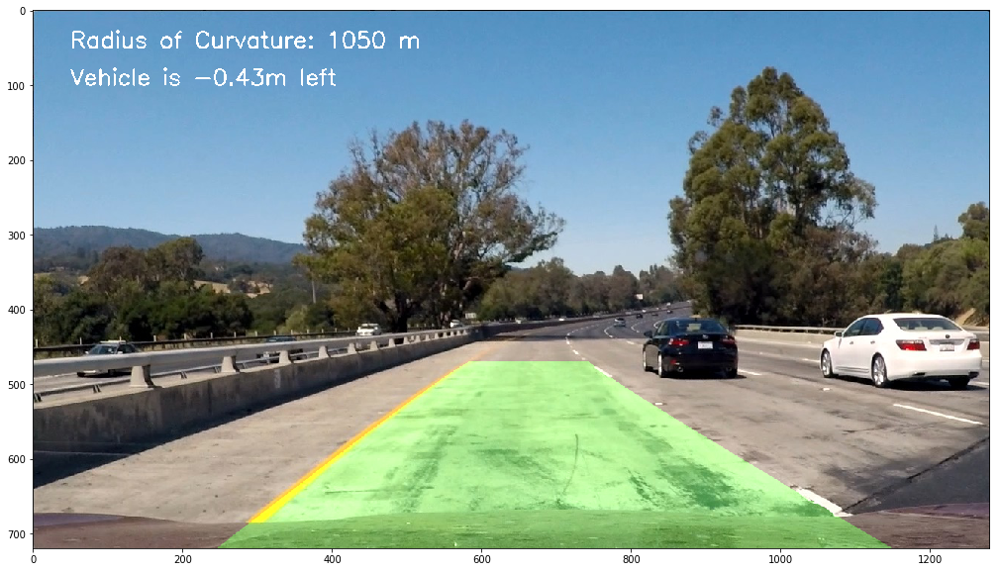

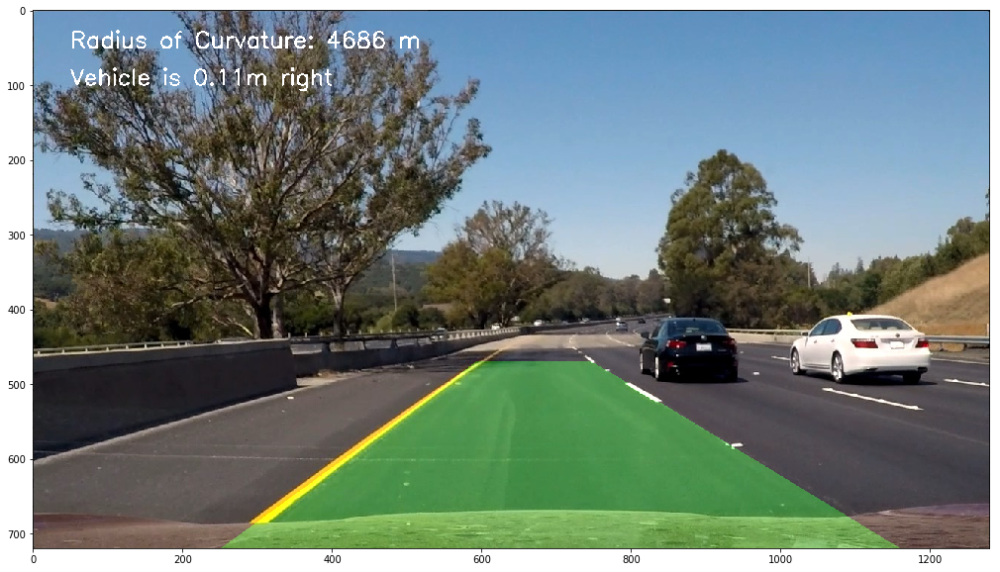

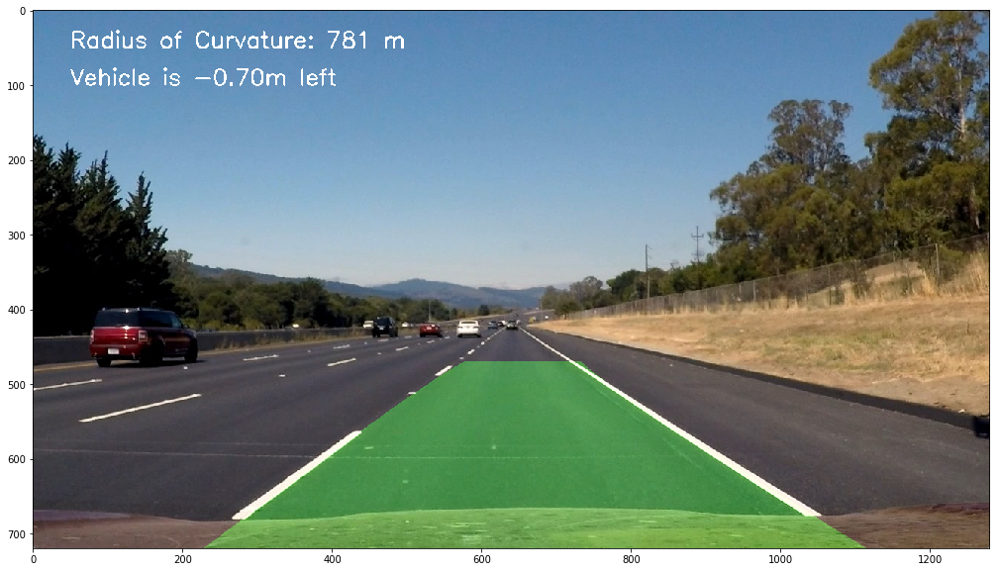

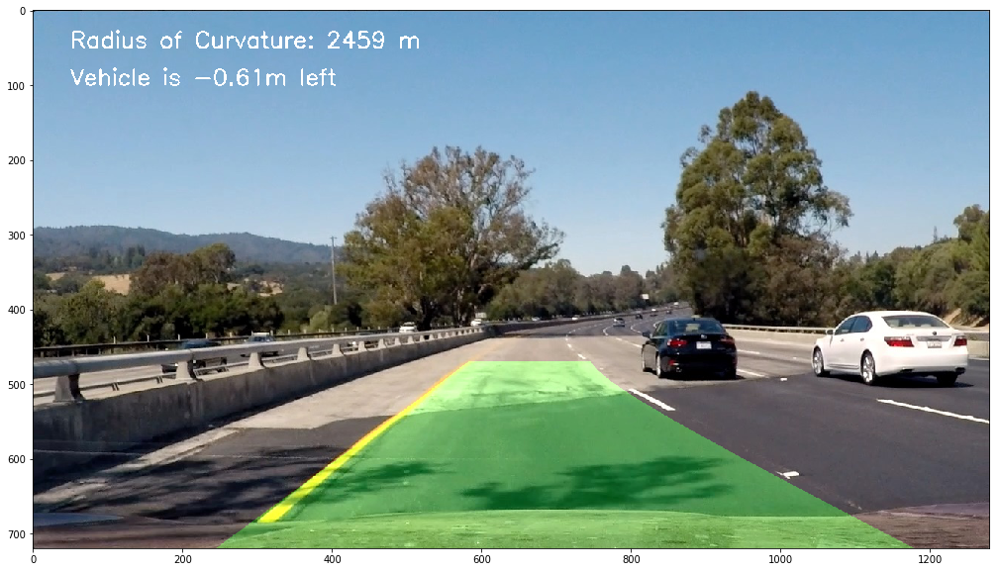

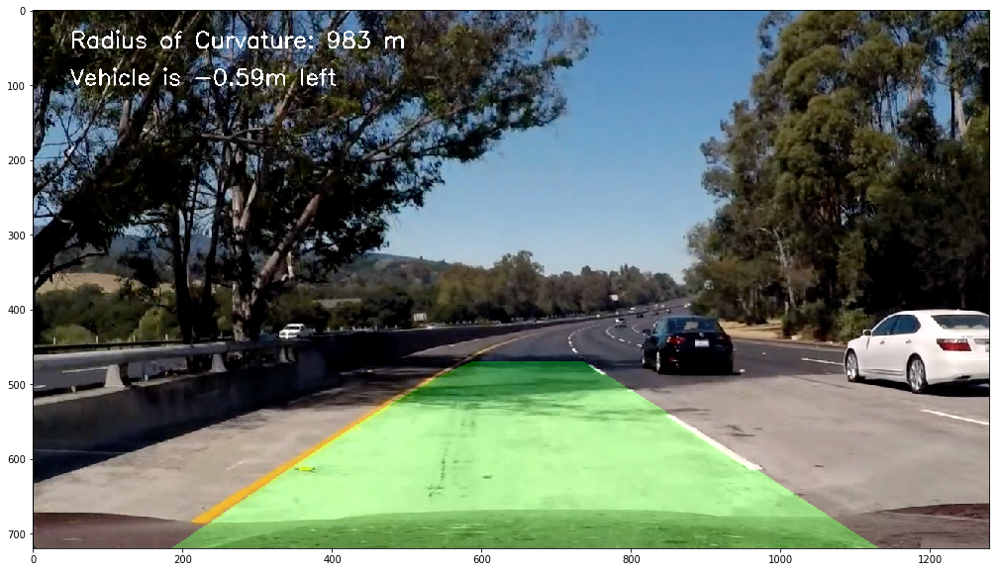

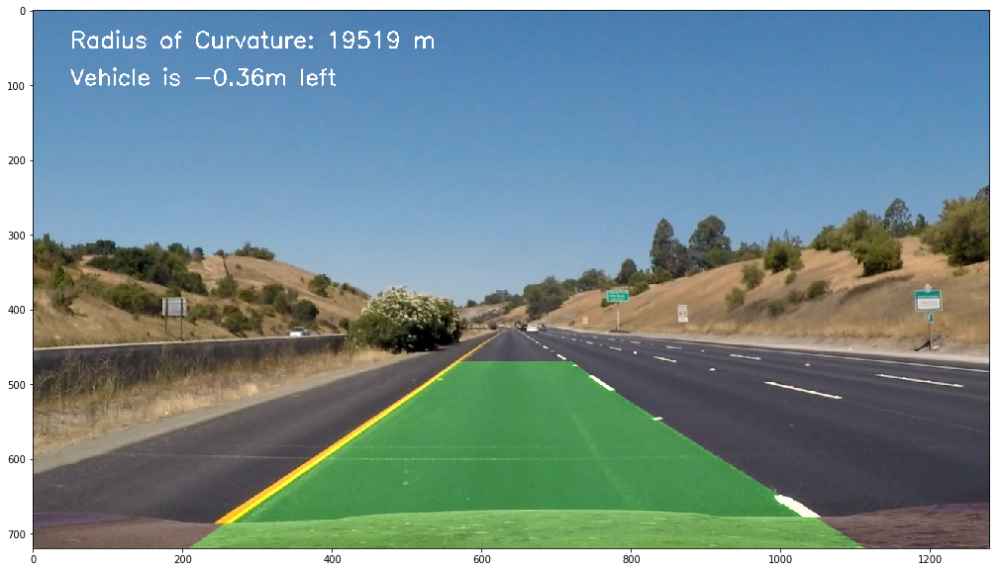

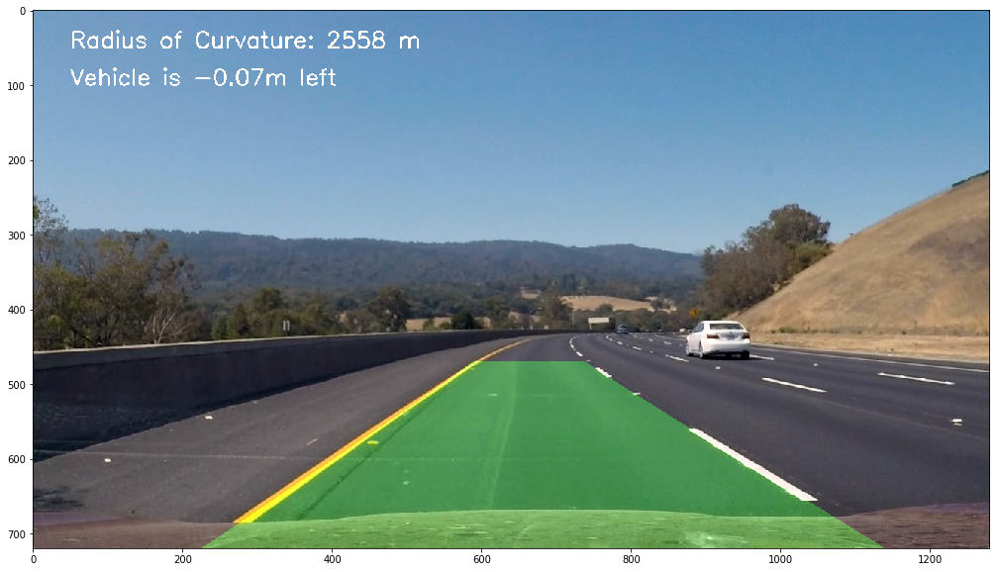

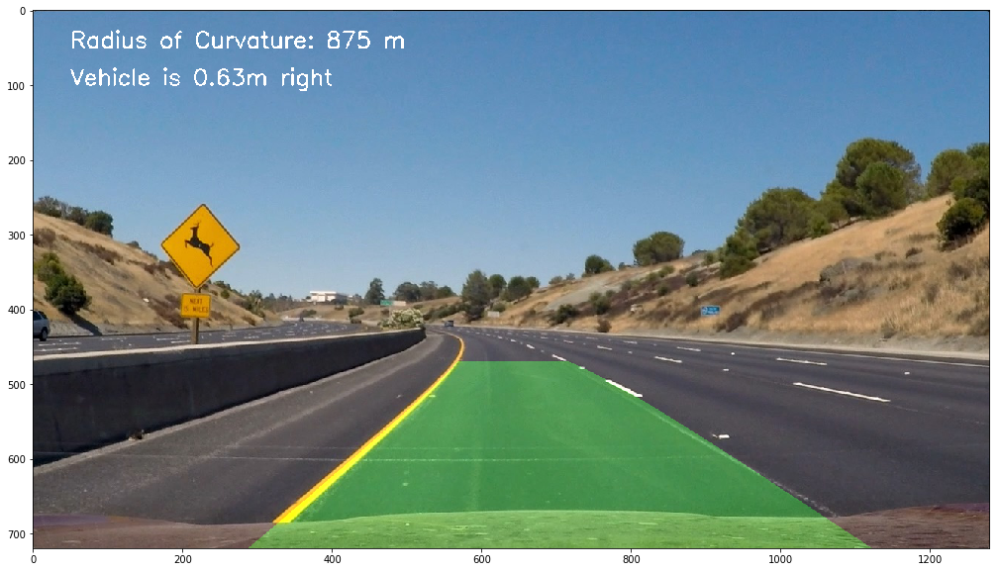

In [20]:
# Read in and make a list of calibration images
test_images = glob.glob('test_images/*.jpg')
   
# Step through the list of test images
for img in test_images:
    img = cv2.imread(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = pipeline(img, True)

In [21]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [22]:
lane = laneLines()
def process_image(img):
    return pipeline(img)

In [ ]:
white_output = 'output_video/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_video/project_video.mp4
[MoviePy] Writing video output_video/project_video.mp4


100%|█████████▉| 1260/1261 [12:50<00:00,  1.70it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video/project_video.mp4 

CPU times: user 8min 45s, sys: 1min 33s, total: 10min 18s
Wall time: 12min 53s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [ ]:
white_output2 = 'output_video/challenge_video.mp4'
clip2 = VideoFileClip("challenge_video.mp4")
white_clip = clip2.fl_image(process_image)
%time white_clip.write_videofile(white_output2, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output2))

In [ ]:
white_output3 = 'output_video/harder_challenge_video.mp4'
clip3 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip3.fl_image(process_image)
%time white_clip.write_videofile(white_output3, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output3))